<a href="https://colab.research.google.com/github/rahulrajbo/Supervised-Model/blob/main/Regression_Bike_Sharing_Demand_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Capstone Project - Bike Sharing Demand Prediction(Regression)**

Currently Rental bikes are introduced in many urban cities for the enhancement of mobility comfort. It is important to make the rental bike available and accessible to the public at the right time as it lessens the waiting time. Eventually, providing the city with a stable supply of rental bikes becomes a major concern. The crucial part is the prediction of bike count required at each hour for the stable supply of rental bikes.

# **Import Libraries**

In [ ]:
# Importing numpy, pandas and tensorflow
import pandas as pd
import numpy as np
import tensorflow as tf

#data visualization libraries
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set_style("ticks")
sns.set_context("poster");
import plotly.express as px

# Z score
from scipy import stats          # was using to detect outliers
from scipy.stats import norm

# Datetime library for manipulating Date columns.
from datetime import datetime
import calendar

from sklearn.preprocessing import StandardScaler,MinMaxScaler, LabelEncoder, OneHotEncoder, PolynomialFeatures

# Importing various machine learning models.
from sklearn.linear_model import Lasso, Ridge, LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR

# XGB regressor.
from xgboost import XGBRegressor

#calculating VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

# spilitting data
from sklearn.model_selection import train_test_split

#for optimization
from sklearn.model_selection import RandomizedSearchCV

# Import different metrics from sci-kit libraries for model evaluation.
from sklearn import metrics
from sklearn.metrics import r2_score as r2
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import mean_absolute_error as mae

# The following lines adjust the granularity of reporting.
pd.options.display.max_rows = 50
pd.options.display.float_format = "{:.3f}".format

# Importing warnings library. The warnings module handles warnings in Python.
import warnings
warnings.filterwarnings('ignore')

# **Loading the dataset**

In [ ]:
#here google drive is attached to colab so that files can be accessed easily
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Machine Learning/Regression Models/SeoulBikeData.csv', encoding = 'ISO-8859-1')

# **Data Wrangling**

In [ ]:
#displaying data from file using head function
df.head(10)

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.200,37,2.200,2000,-17.600,0.000,0.000,0.000,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.500,38,0.800,2000,-17.600,0.000,0.000,0.000,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.000,39,1.000,2000,-17.700,0.000,0.000,0.000,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.200,40,0.900,2000,-17.600,0.000,0.000,0.000,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.000,36,2.300,2000,-18.600,0.000,0.000,0.000,Winter,No Holiday,Yes
5,01/12/2017,100,5,-6.400,37,1.500,2000,-18.700,0.000,0.000,0.000,Winter,No Holiday,Yes
6,01/12/2017,181,6,-6.600,35,1.300,2000,-19.500,0.000,0.000,0.000,Winter,No Holiday,Yes
7,01/12/2017,460,7,-7.400,38,0.900,2000,-19.300,0.000,0.000,0.000,Winter,No Holiday,Yes
8,01/12/2017,930,8,-7.600,37,1.100,2000,-19.800,0.010,0.000,0.000,Winter,No Holiday,Yes
9,01/12/2017,490,9,-6.500,27,0.500,1928,-22.400,0.230,0.000,0.000,Winter,No Holiday,Yes


**Describing DataSet**

The dataset contains weather information (Temperature, Humidity, Windspeed, Visibility, Dewpoint, Solar radiation, Snowfall, Rainfall), the number of bikes rented per hour and date information.

**Attribute Information:**

Date--	Date of Rented Bike

Rented Bike count--	Number of total rentals

Hour--	Hours of the day

Temperature(°C)--	Weather Temperature in °C

Humidity(%)--	Humidity of the day in %

Wind speed (m/s)--	Wind speed in m/s

Visibility (10m)--	Atmospherical Visibility within 10 𝑚 range

Dew point temperature(°C)--	Dew Point Temperature - T dp in °C

Solar Radiation (MJ/m2)--	Indicate light and energy that comes from the sun in MJ/m2

Rainfall(mm)--	Rain fall in mm

Snowfall (cm)--	Snow fall in cm

Seasons--	Autumn, Spring, Summer, Winter

Holiday--	Whether the day is considered a holiday

Functioning Day--	Whether the day is neither a weekend nor holiday

In [ ]:
df.shape

(8760, 14)

The dataset contains 8760 rows and 14 columns. Each row of the dataset contains information about weather conditions

In [ ]:
# Check for duplicated entries.
print("Duplicate entry in data:",len(df[df.duplicated()]))

Duplicate entry in data: 0


In [ ]:
# Check for null values
df.isnull().sum()

Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
dtype: int64

In [ ]:
#List of columns of the dataframe
df.columns

Index(['Date', 'Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day'],
      dtype='object')

In [ ]:
#describing dataset to get Statistical info
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Rented Bike Count,8760.000,704.602,644.997,0.000,191.000,504.500,1065.250,3556.000
Hour,8760.000,11.500,6.923,0.000,5.750,11.500,17.250,23.000
Temperature(°C),8760.000,12.883,11.945,-17.800,3.500,13.700,22.500,39.400
Humidity(%),8760.000,58.226,20.362,0.000,42.000,57.000,74.000,98.000
Wind speed (m/s),8760.000,1.725,1.036,0.000,0.900,1.500,2.300,7.400
Visibility (10m),8760.000,1436.826,608.299,27.000,940.000,1698.000,2000.000,2000.000
Dew point temperature(°C),8760.000,4.074,13.060,-30.600,-4.700,5.100,14.800,27.200
Solar Radiation (MJ/m2),8760.000,0.569,0.869,0.000,0.000,0.010,0.930,3.520
Rainfall(mm),8760.000,0.149,1.128,0.000,0.000,0.000,0.000,35.000
Snowfall (cm),8760.000,0.075,0.437,0.000,0.000,0.000,0.000,8.800


For mixed data types provided via a DataFrame, the default is to return only an analysis of numeric columns. If the dataframe consists only of object and categorical data without any numeric columns, the default is to return an analysis of both the object and categorical columns. If include='all' is provided as an option, the result will include a union of attributes of each type.

We may not need to perform extensive data cleansing because the ranges of values in the numerical columns appear fair as well. However,columns like Wind speed , Dew_point_temperature, Solar Radiation, Rainfall and Snowfall appears to be skewed as their median (50 percentile) is much lower than the highest value.

In [ ]:
# Changing Date data type
#creating copy to keep oringal data safe
data = df.copy()

In [ ]:
data['Date'] = pd.to_datetime(data['Date'], infer_datetime_format=True)

**Extracting date, month, year from date and adding to dataset**

In [ ]:
#Extracting month from date column
data['Month'] = data['Date'].dt.month
#Extracting day name from date
data['Day'] = data['Date'].dt.day
data['WeekDay'] = data['Date'].dt.day_name()

#Extracting year
data['Year'] = data['Date'].dt.year

#drop Date column
data.drop('Date', axis= 1, inplace= True)
data.head()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Month,Day,WeekDay,Year
0,254,0,-5.200,37,2.200,2000,-17.600,0.000,0.000,0.000,Winter,No Holiday,Yes,1,12,Thursday,2017
1,204,1,-5.500,38,0.800,2000,-17.600,0.000,0.000,0.000,Winter,No Holiday,Yes,1,12,Thursday,2017
2,173,2,-6.000,39,1.000,2000,-17.700,0.000,0.000,0.000,Winter,No Holiday,Yes,1,12,Thursday,2017
3,107,3,-6.200,40,0.900,2000,-17.600,0.000,0.000,0.000,Winter,No Holiday,Yes,1,12,Thursday,2017
4,78,4,-6.000,36,2.300,2000,-18.600,0.000,0.000,0.000,Winter,No Holiday,Yes,1,12,Thursday,2017


In [ ]:
# Categorical Data
col = data._get_numeric_data().columns
categorical = [x for x in data.columns if x not in col]
categorical

['Seasons', 'Holiday', 'Functioning Day', 'WeekDay']

Columns ‘Seasons’, 'Holiday', ‘Functioning Day’, 'WeekDay' are categorical columns

In [ ]:
# Discrete Data
discrete = [x for x in  col if len(data[x].unique())<=10]
discrete

['Year']

'year' is a discrete type column

In [ ]:
# Continuous Data
continuous = [x for x in col if x not in discrete]
continuous

['Rented Bike Count',
 'Hour',
 'Temperature(°C)',
 'Humidity(%)',
 'Wind speed (m/s)',
 'Visibility (10m)',
 'Dew point temperature(°C)',
 'Solar Radiation (MJ/m2)',
 'Rainfall(mm)',
 'Snowfall (cm)',
 'Month',
 'Day']

All other columns are continuous type columns

In [ ]:
# Custom Function for Dtype,Unique values and Null values
def datainfo():
    temp_ps = pd.DataFrame(index=data.columns)
    temp_ps['DataType'] = data.dtypes
    temp_ps["Non-null_Values"] = data.count()
    temp_ps['Unique_Values'] = data.nunique()
    temp_ps['NaN_Values'] = data.isnull().sum()
    temp_ps['NaN_Values_Percentage'] = (temp_ps['NaN_Values']/len(data))*100
    return temp_ps
datainfo()

,DataType,Non-null_Values,Unique_Values,NaN_Values,NaN_Values_Percentage
Rented Bike Count,int64,8760,2166,0,0.000
Hour,int64,8760,24,0,0.000
Temperature(°C),float64,8760,546,0,0.000
Humidity(%),int64,8760,90,0,0.000
Wind speed (m/s),float64,8760,65,0,0.000
Visibility (10m),int64,8760,1789,0,0.000
Dew point temperature(°C),float64,8760,556,0,0.000
Solar Radiation (MJ/m2),float64,8760,345,0,0.000
Rainfall(mm),float64,8760,61,0,0.000
Snowfall (cm),float64,8760,51,0,0.000


There are 4 categorical columns and 13 numerical columns. Columns: ‘Seasons’, 'Holiday', ‘Functioning Day’, and 'Weekday' are of 𝑜𝑏𝑗𝑒𝑐𝑡 data type

Columns ‘Rented Bike Count’, ‘Hour’, ‘Humidity (%)', ‘Visibility (10𝑚)', 'Month', 'Day' and 'year' are of 𝑖𝑛𝑡64 numarical data type

Columns ‘Temperature Temperature (℃)’, ‘Wind Speed (𝑚/𝑠)’, ‘Dew Point Temperature (℃)’,‘Solar Radiation (𝑀𝐽/𝑚2)’,‘Rainfall (𝑚𝑚)' and ‘Snowfall(𝑐𝑚) are of 𝑓𝑙𝑜𝑎𝑡64 numarical data type

Not any null value present in any column

Unique count : Seasons- 4 , Holiday- 2 , Functioning Day- 2, Month- 12, Day- 7, Year- 2

Categorial data are those values which can be used to classify information based on similarities.

Numerical data is the information expressed numerically.

Converting them into object data type or changing them into categorial feature than using it as int which will help while encoding them.

In [ ]:
data.dtypes

Rented Bike Count              int64
Hour                           int64
Temperature(°C)              float64
Humidity(%)                    int64
Wind speed (m/s)             float64
Visibility (10m)               int64
Dew point temperature(°C)    float64
Solar Radiation (MJ/m2)      float64
Rainfall(mm)                 float64
Snowfall (cm)                float64
Seasons                       object
Holiday                       object
Functioning Day               object
Month                          int64
Day                            int64
WeekDay                       object
Year                           int64
dtype: object

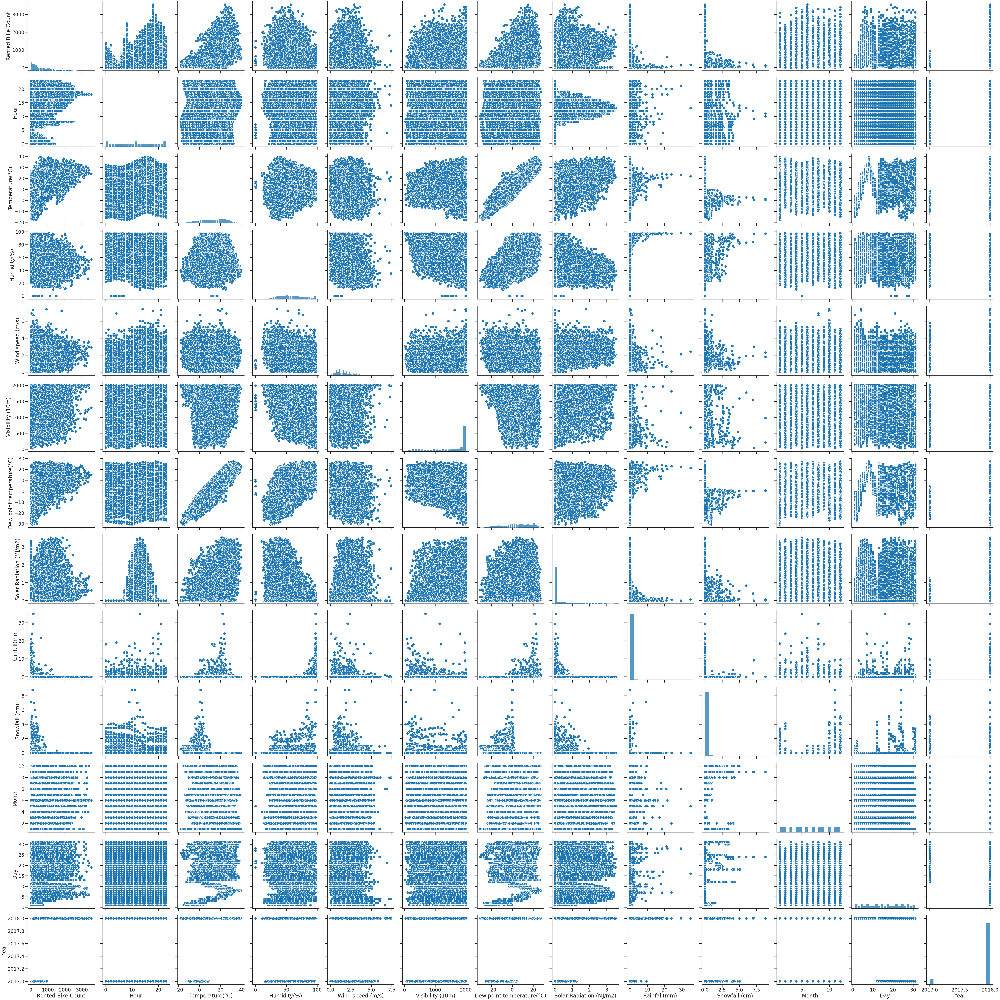

In [ ]:
sns.pairplot(data, height =5)

Bike rent demand is high in 2018 in comparison to year 2017.

Demand of Bike is less at 1st, 2nd, and 12th day of the month.

June month has high bike rent demand compare to other months.

Bike rent demand is high when snowfall and rainfall are lowest.

As Solar radiation increases Bike rent demand decreases.

At very low Dew point temperature bike rent demand is less.

At low visibility bike rent demand is less.

At high wind speed bike rent demand is less.

At very low humidity and very high Humidity bike rent demand is less.

At very low temperature bike rent demand is high.

At 12 AM to 6 AM bike demand is low. At 9 AM bike demand is high . At 4 PM to 8 PM bike demand is high and highest at 6 PM.

Rented bike count, Wind Speed is Right Skewed.

Temperature, Humidity is normal distribution.





# **Visualization**

**Univariate, Bivariate and Multi-variate analysis**

In [ ]:
#Creating a visualisation for the seasons column
plt.figure(figsize=(10, 7))
sum_rented_bikes_season = data.groupby('Seasons')['Rented Bike Count'].sum().reset_index()
sum_rented_bikes_season

,Seasons,Rented Bike Count
0,Autumn,1790002
1,Spring,1611909
2,Summer,2283234
3,Winter,487169


<Figure size 1000x700 with 0 Axes>

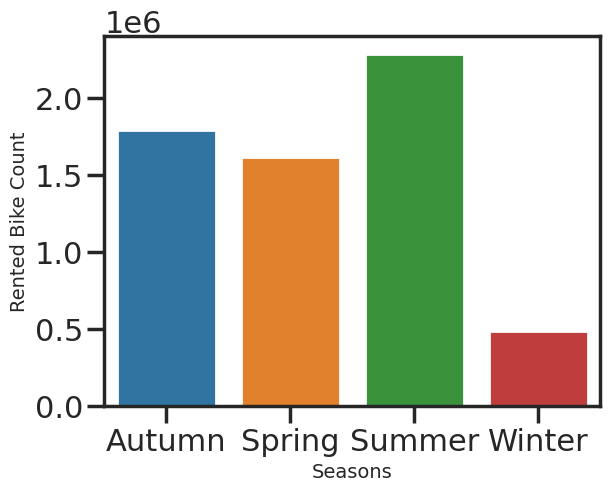

In [ ]:
sns.barplot(data=sum_rented_bikes_season, x='Seasons', y='Rented Bike Count', hue = 'Seasons')
plt.xlabel("Seasons", size=14)
plt.ylabel("Rented Bike Count", size=14)
plt.show()

As we can see that summer has the highest number of bikes rented. This could be because of the vacation mood created in summer and also the increase in the number of tourists. Winter however is the season where the least number of bikes are rented.

In [ ]:
#Creating a visualisation for the holidays dataframe
plt.figure(figsize=(7,7))
holidays_col = data.groupby('Holiday')['Rented Bike Count'].sum().reset_index()
holidays_col

,Holiday,Rented Bike Count
0,Holiday,215895
1,No Holiday,5956419


<Figure size 700x700 with 0 Axes>

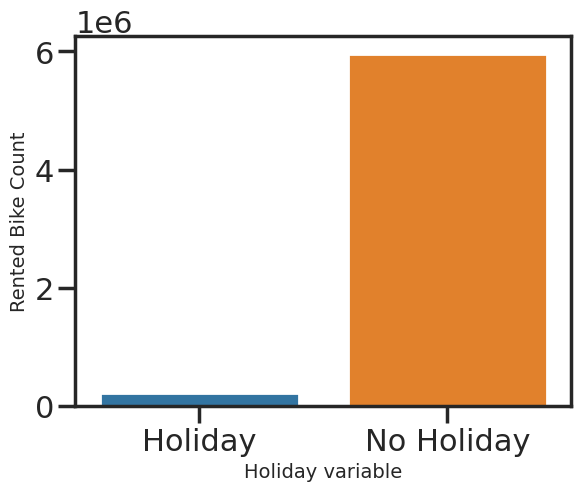

In [ ]:
sns.barplot(data=holidays_col,x='Holiday',y='Rented Bike Count', hue = 'Holiday')
plt.xlabel("Holiday variable",size=14)
plt.ylabel("Rented Bike Count", size=14)
plt.show()

As we can see that the majority of the bikes rented are on days which are considered as No Holiday.

In [ ]:
#Creating a visualisation to analyse the number of bikes rented for different temperatures
plt.figure(figsize=(10,7))
temp_bike = data.groupby('Temperature(°C)')['Rented Bike Count'].sum().reset_index()
temp_bike.head()

,Temperature(°C),Rented Bike Count
0,-17.800,322
1,-17.500,291
2,-17.400,64
3,-16.900,36
4,-16.500,96


<Figure size 1000x700 with 0 Axes>

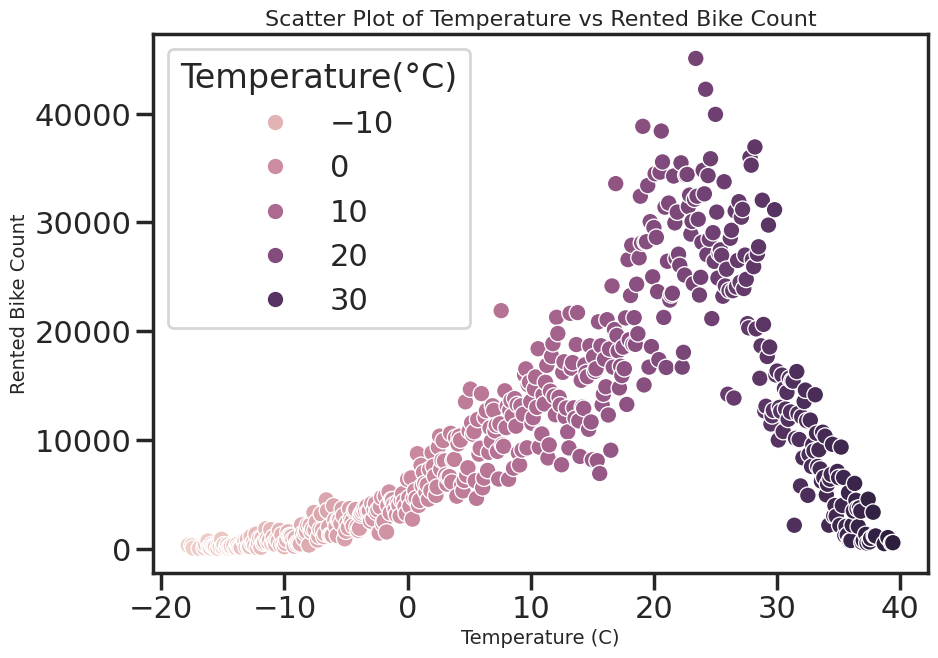

In [ ]:
plt.figure(figsize=(10, 7))
sns.scatterplot(data=temp_bike, x='Temperature(°C)', y='Rented Bike Count', hue= 'Temperature(°C)')
plt.xlabel("Temperature (C)", size=14)
plt.ylabel("Rented Bike Count", size=14)
plt.title("Scatter Plot of Temperature vs Rented Bike Count", size=16)
plt.show()

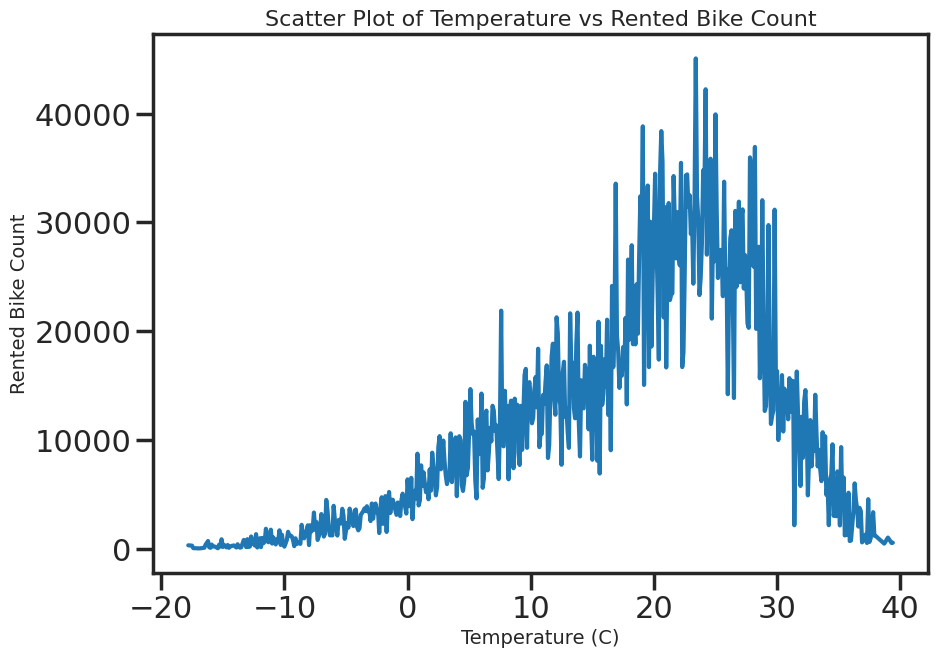

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(temp_bike['Temperature(°C)'],temp_bike['Rented Bike Count'])
plt.xlabel("Temperature (C)", size=14)
plt.ylabel("Rented Bike Count", size=14)
plt.title("Scatter Plot of Temperature vs Rented Bike Count", size=16)
plt.show()

As we can see that the most number of bikes rented are in the temperature range of 15 degrees to 30 degrees.

In [ ]:
#Creating a dataframe to analyse the number of bikes rented for different intensities of snowfall
snowfall_bike = data.groupby('Snowfall (cm)')['Rented Bike Count'].sum().reset_index()
snowfall_bike.head()

,Snowfall (cm),Rented Bike Count
0,0.000,6090314
1,0.100,205
2,0.200,3643
3,0.300,8304
4,0.400,5981


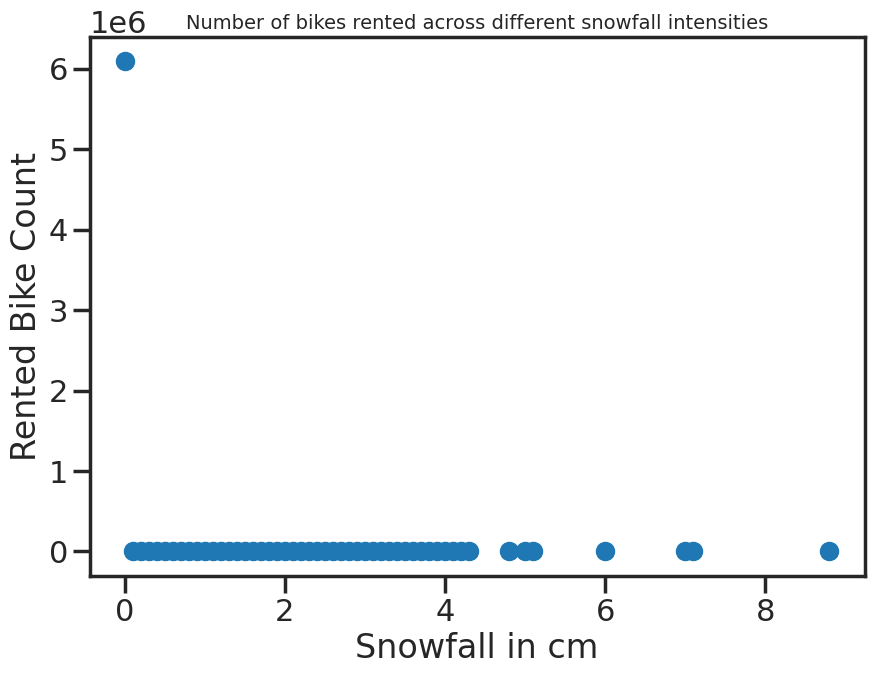

In [ ]:
#Creating a visualisation for different snowfall intensities
plt.figure(figsize = (10,7))
plt.scatter(data=snowfall_bike,x='Snowfall (cm)',y='Rented Bike Count')
plt.title('Number of bikes rented across different snowfall intensities',size=14)
plt.xlabel('Snowfall in cm')
plt.ylabel('Rented Bike Count')
plt.show()

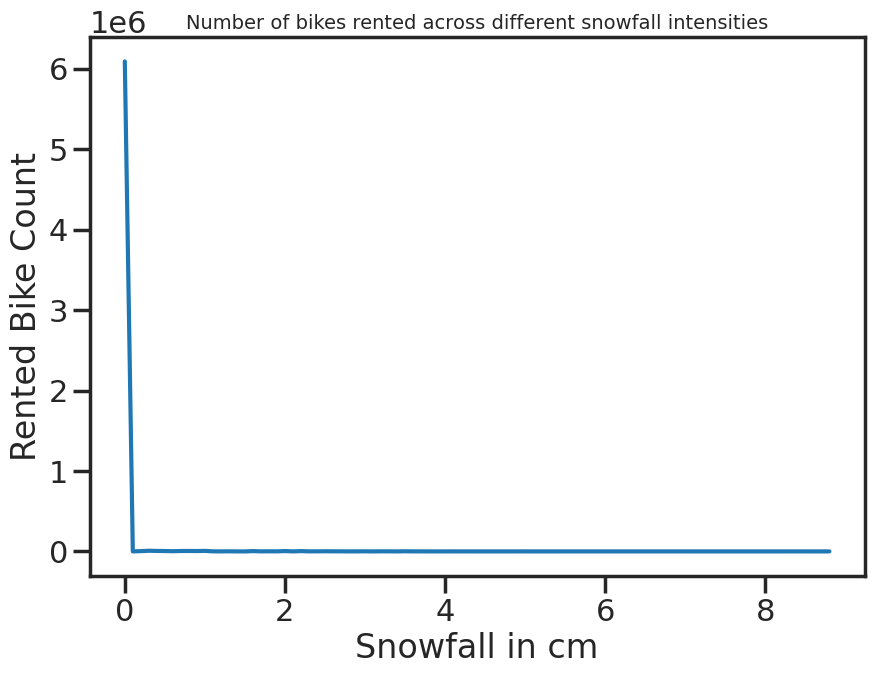

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(snowfall_bike['Snowfall (cm)'],snowfall_bike['Rented Bike Count'])
plt.title('Number of bikes rented across different snowfall intensities',size=14)
plt.xlabel('Snowfall in cm')
plt.ylabel('Rented Bike Count')
plt.show()

We can see here that most of the bikes are rented when there is no snowfall at all.

In [ ]:
#Creating a dataframe to analyse the number of bikes rented for different intensities of rainfall
rainfall_bike = data.groupby('Rainfall(mm)')['Rented Bike Count'].sum().reset_index()
rainfall_bike.head()

,Rainfall(mm),Rented Bike Count
0,0.000,6086009
1,0.100,15179
2,0.200,3706
3,0.300,1401
4,0.400,2147


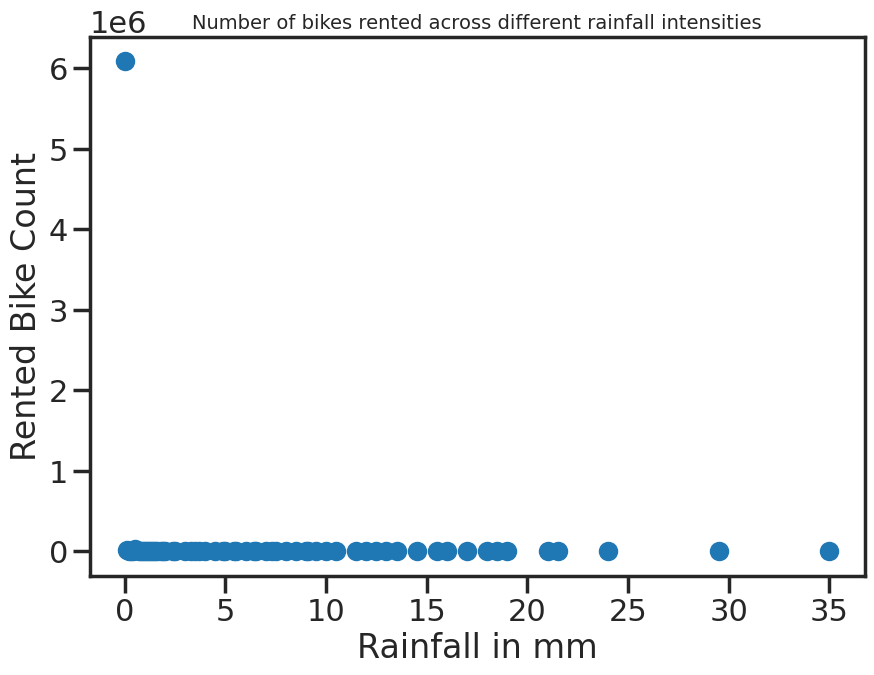

In [ ]:
#Creating a visualisation for different rainfall intensities
plt.figure(figsize = (10,7))
plt.scatter(data=rainfall_bike,x='Rainfall(mm)',y='Rented Bike Count')
plt.title('Number of bikes rented across different rainfall intensities',size=14)
plt.xlabel('Rainfall in mm')
plt.ylabel('Rented Bike Count')
plt.show()

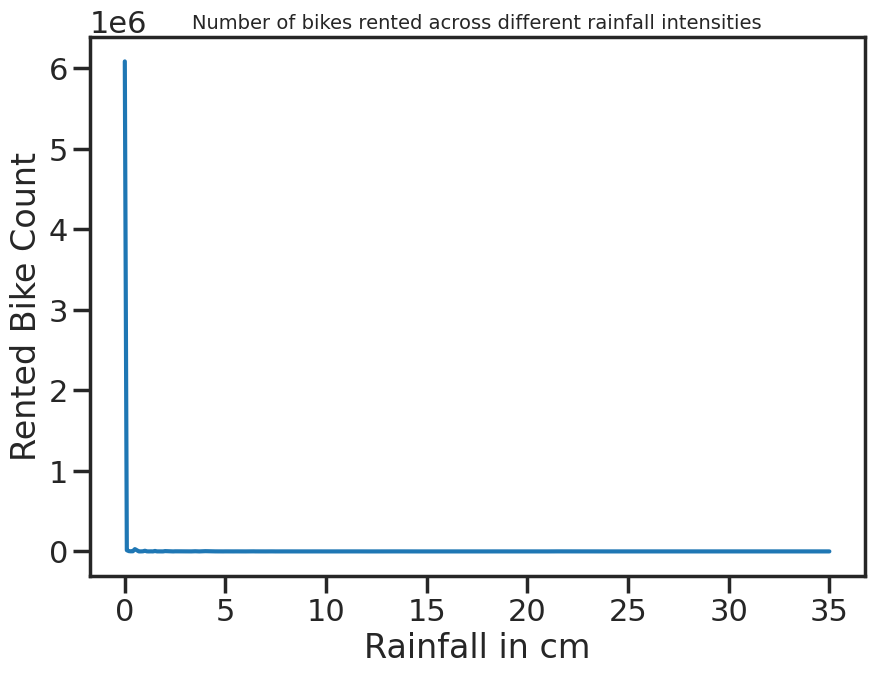

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(rainfall_bike['Rainfall(mm)'],rainfall_bike['Rented Bike Count'])
plt.title('Number of bikes rented across different rainfall intensities',size=14)
plt.xlabel('Rainfall in cm')
plt.ylabel('Rented Bike Count')
plt.show()

the most number of bikes are rented when there is no rainfall.

In [ ]:
#Creating a dataframe for analysing the number of bikes rented for different humidity percentages.
humidity_bike = data.groupby('Humidity(%)')['Rented Bike Count'].sum().reset_index()
humidity_bike.head()

,Humidity(%),Rented Bike Count
0,0,6930
1,10,1315
2,11,1986
3,12,2032
4,13,4353


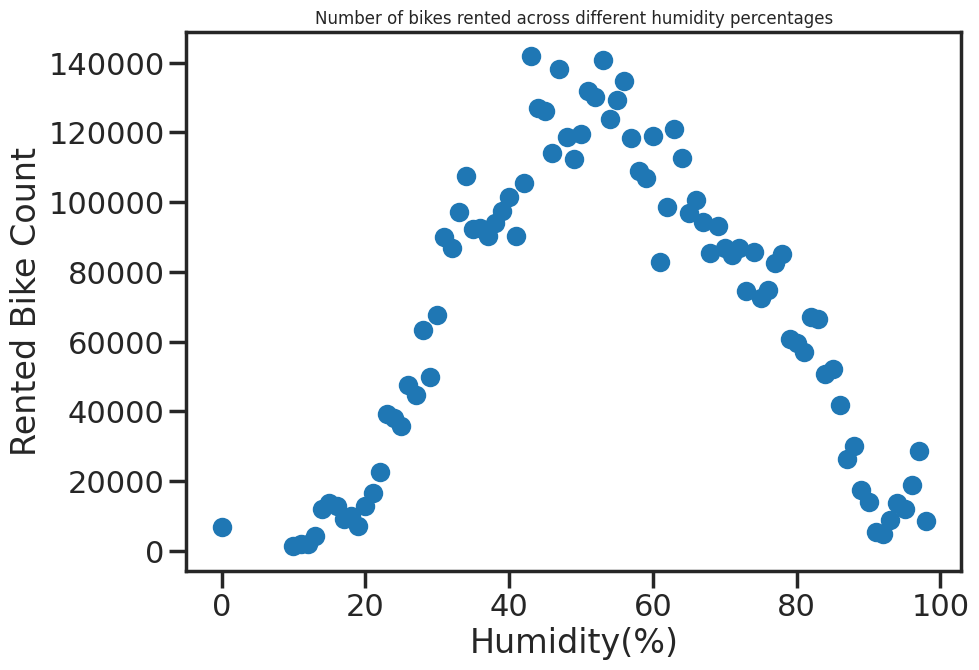

In [ ]:
#Creating a visualisation for different humidity intensities
plt.figure(figsize=(10, 7))
plt.scatter(data=humidity_bike,x='Humidity(%)',y='Rented Bike Count')
plt.title('Number of bikes rented across different humidity percentages',size=12)
plt.xlabel('Humidity(%)')
plt.ylabel('Rented Bike Count')
plt.show()

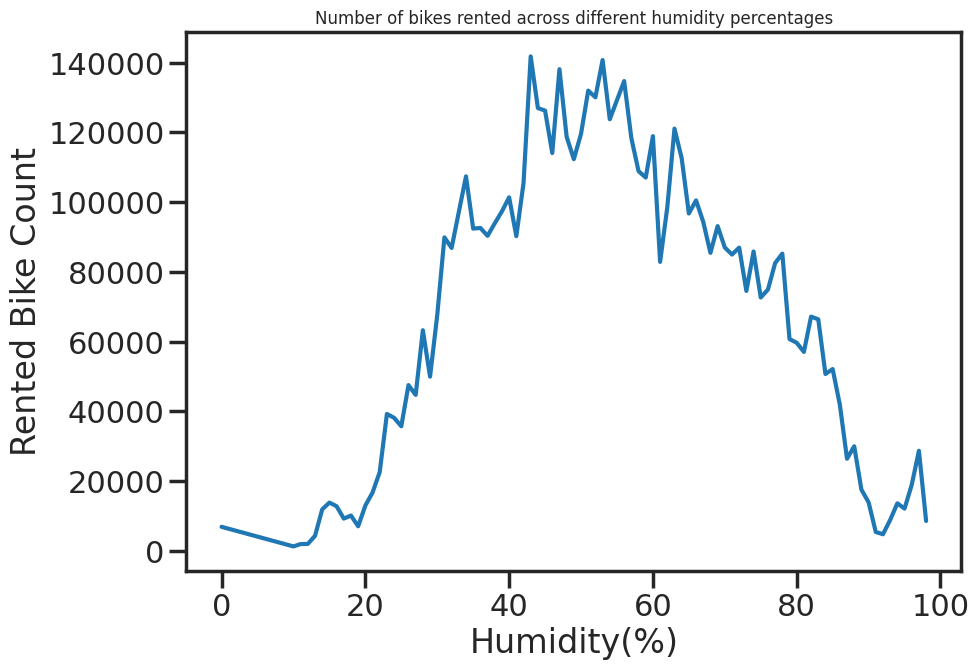

In [ ]:
#Plotting a visualisation for the different humidity percentages
plt.figure(figsize=(10, 7))
plt.plot(humidity_bike['Humidity(%)'],humidity_bike['Rented Bike Count'])
plt.xlabel('Humidity(%)')
plt.ylabel("Rented Bike Count")
plt.title("Number of bikes rented across different humidity percentages", size =12)
plt.show()

As we can see that the majority of the bikes are rented for a humidity percentage range of 30 to 70.

In [ ]:
#Creating a dataframe to analyse the number of bikes rented for different visibility rates
visibility_bike = data.groupby('Visibility (10m)')['Rented Bike Count'].sum().reset_index()
visibility_bike.head()

,Visibility (10m),Rented Bike Count
0,27,83
1,33,33
2,34,24
3,38,98
4,53,65


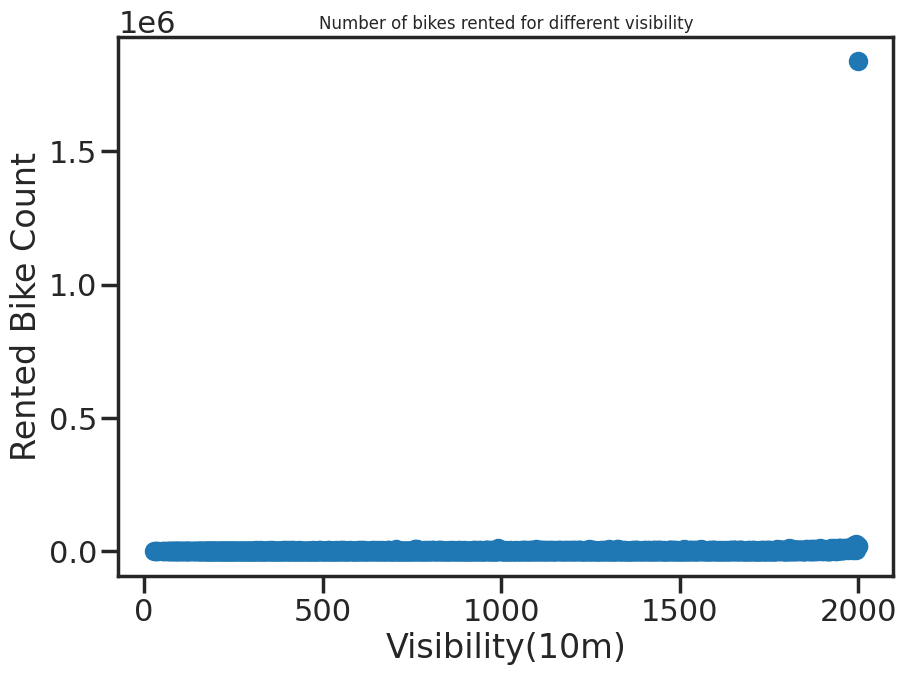

In [ ]:
#Creating a visualisation for number of bikes rented in different visibility ranges
plt.figure(figsize=(10, 7))
plt.scatter(data=visibility_bike,x='Visibility (10m)',y='Rented Bike Count')
plt.title('Number of bikes rented for different visibility', size = 12)
plt.xlabel('Visibility(10m)')
plt.ylabel('Rented Bike Count')
plt.show()

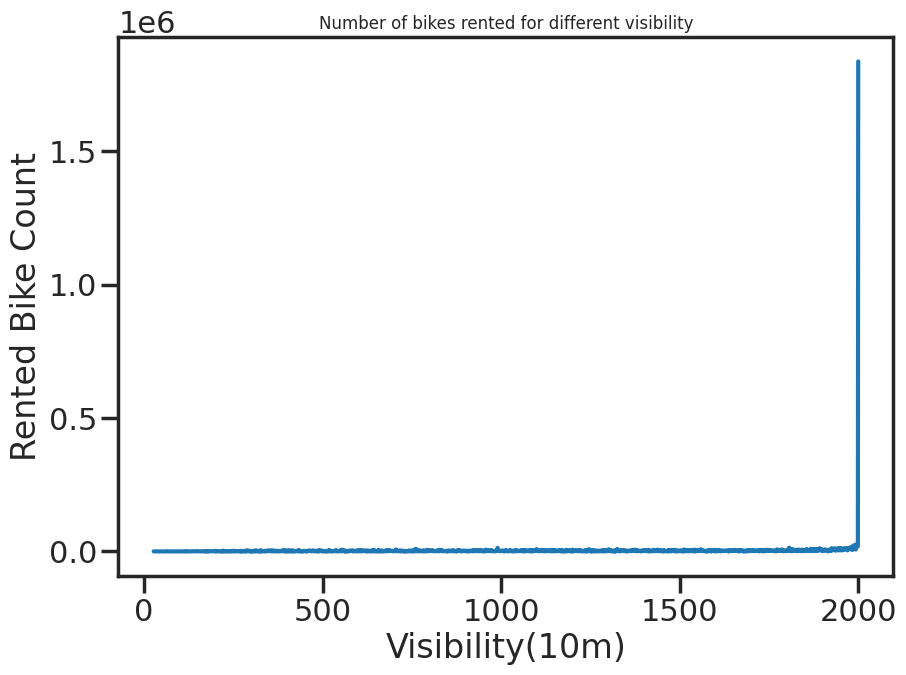

In [ ]:
#Creating a visualisation for number of bikes rented in different visibility ranges
plt.figure(figsize=(10, 7))
plt.plot(visibility_bike['Visibility (10m)'],visibility_bike['Rented Bike Count'])
plt.xlabel('Visibility(10m)')
plt.ylabel('Rented Bike Count')
plt.title('Number of bikes rented for different visibility', size= 12)
plt.show()

We can see that higher visibility is preffered by the customers. Through further analysis of the visibility_bike dataframe we can see that for increasing visibility there is an increase in bikes rented.

In [ ]:
#Creating a dataframe to analyse the number of bikes rented for different years
year_df = data.groupby('Year')['Rented Bike Count'].sum().reset_index()
year_df

,Year,Rented Bike Count
0,2017,185330
1,2018,5986984


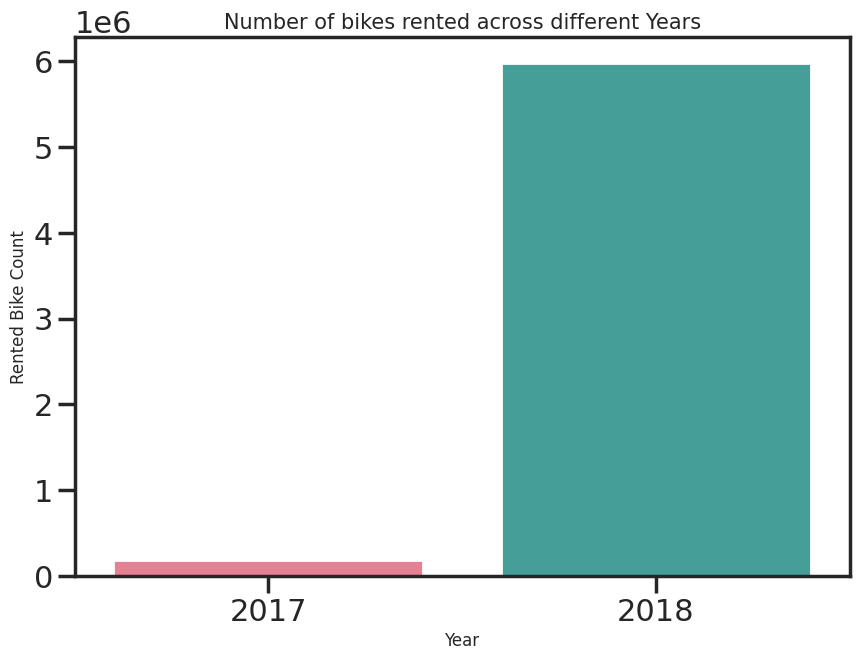

In [ ]:
#Creating a visualisation for different years
plt.figure(figsize=(10,7))
sns.barplot(data=year_df,x='Year',y='Rented Bike Count', palette= 'husl')
plt.title('Number of bikes rented across different Years',size=15)
plt.xlabel('Year',size=12)
plt.ylabel('Rented Bike Count',size=12)
plt.show()

Here we can see that the highest number of bike rentals have been done in the year 2018.

In [ ]:
# Group the data by month and calculate the sum of rented bike count
month_df = data.groupby('Month')['Rented Bike Count'].sum().reset_index()
print(month_df)

    Month  Rented Bike Count
0       1             287244
1       2             264112
2       3             455037
3       4             556219
4       5             665948
5       6             706728
6       7             691339
7       8             614190
8       9             499326
9      10             626988
10     11             493412
11     12             311771


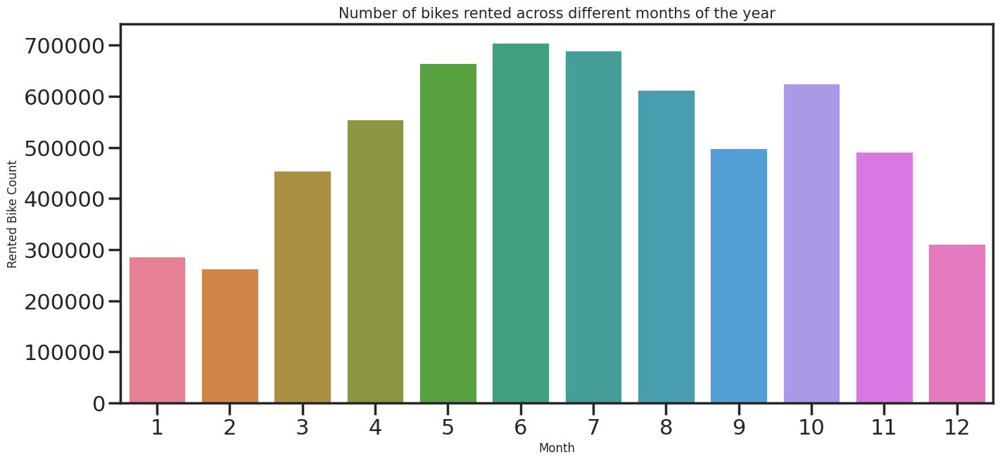

In [ ]:
#Creating a visualisation for different months of the year
plt.figure(figsize=(16,7))
sns.barplot(data=month_df,x='Month',y='Rented Bike Count', palette= 'husl')
plt.title('Number of bikes rented across different months of the year',size=15)
plt.xlabel('Month',size=12)
plt.ylabel('Rented Bike Count',size=12)
plt.show()

Here we can see that the highest number of bike rentals have been done in the month of 'May', 'June', 'July' and low in the month of 'January', 'February','December'.

In [ ]:
# Group the data by day and calculate the sum of rented bike count
day_df = data.groupby('Day')['Rented Bike Count'].sum().reset_index()
day_df

,Day,Rented Bike Count
0,1,64062
1,2,53694
2,3,117813
3,4,170431
4,5,235021
5,6,371295
6,7,272954
7,8,247818
8,9,335006
9,10,210966


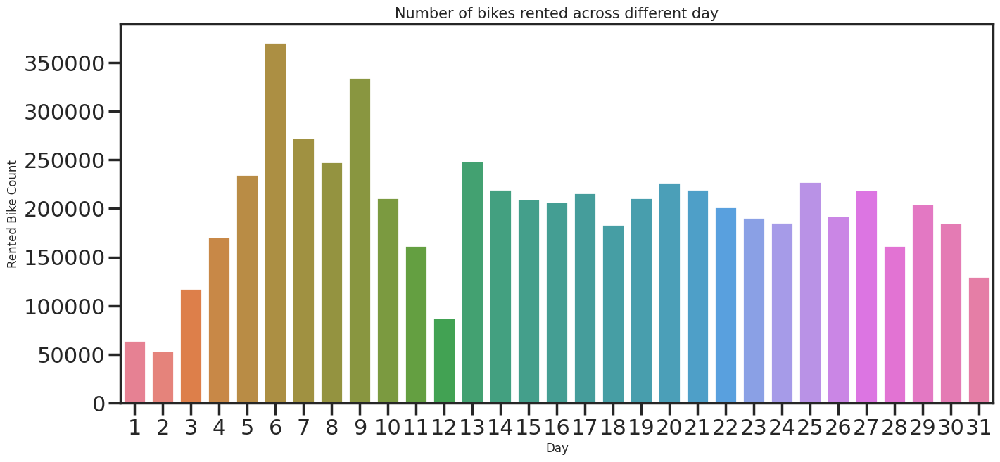

In [ ]:
#Creating a dataframe to analyse the number of bikes rented for different day
plt.figure(figsize=(16,7))
sns.barplot(data=day_df,x='Day',y='Rented Bike Count', palette= 'husl')
plt.title('Number of bikes rented across different day',size=15)
plt.xlabel('Day',size=12)
plt.ylabel('Rented Bike Count',size=12)
plt.show()

In [ ]:
#Creating a dataframe to analyse the number of bikes rented for different hours of the day
hour_df = data.groupby('Hour')['Rented Bike Count'].sum().reset_index()
hour_df

,Hour,Rented Bike Count
0,0,197633
1,1,155557
2,2,110095
3,3,74216
4,4,48396
5,5,50765
6,6,104961
7,7,221192
8,8,370731
9,9,235784


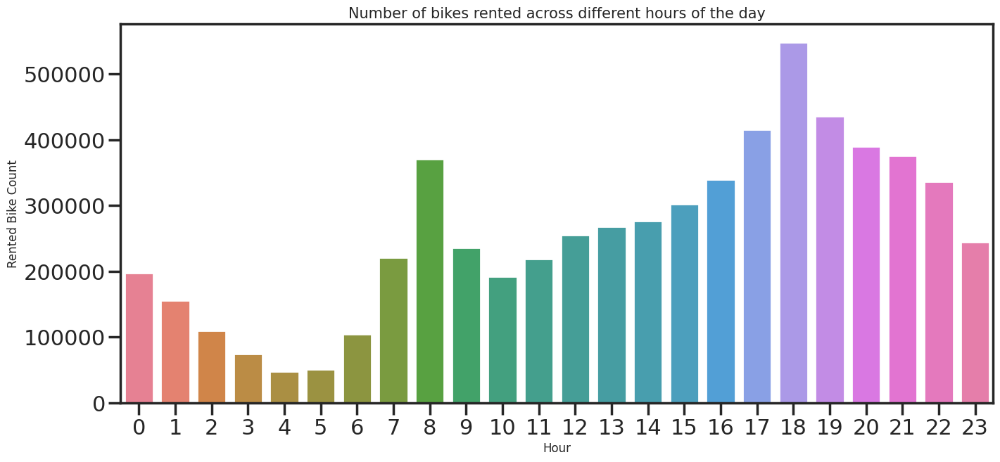

In [ ]:
#Creating a visualisation for different hours of the day
plt.figure(figsize=(16,7))
sns.barplot(data=hour_df,x='Hour',y='Rented Bike Count', palette= 'husl')
plt.title('Number of bikes rented across different hours of the day',size=15)
plt.xlabel('Hour',size=12)
plt.ylabel('Rented Bike Count',size=12)
plt.show()

Here we can see that the highest number of bike rentals have been done in the 18th hour, i.e 6pm, and lowest in the 4th hour, i.e 4am.

<Figure size 1000x700 with 0 Axes>

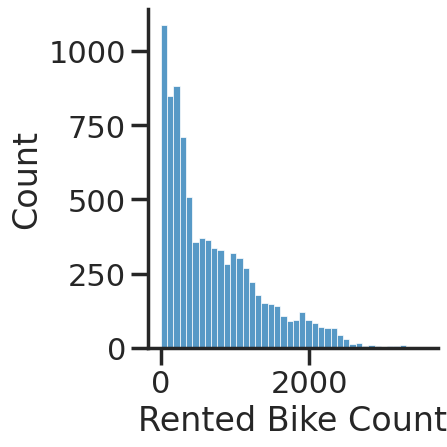

In [ ]:
# Histogram of Rented Bike Count
plt.figure(figsize=(10,7))
sns.displot(data['Rented Bike Count'])

It is Right Skewed.

<Figure size 4000x700 with 0 Axes>

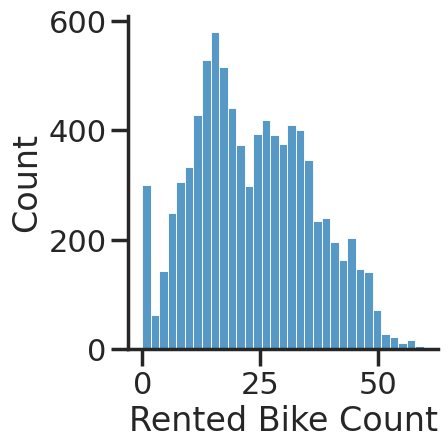

In [ ]:
# Let's try to convert it into normal distributed

plt.figure(figsize=(40,7))
sns.displot(np.sqrt(data['Rented Bike Count']))

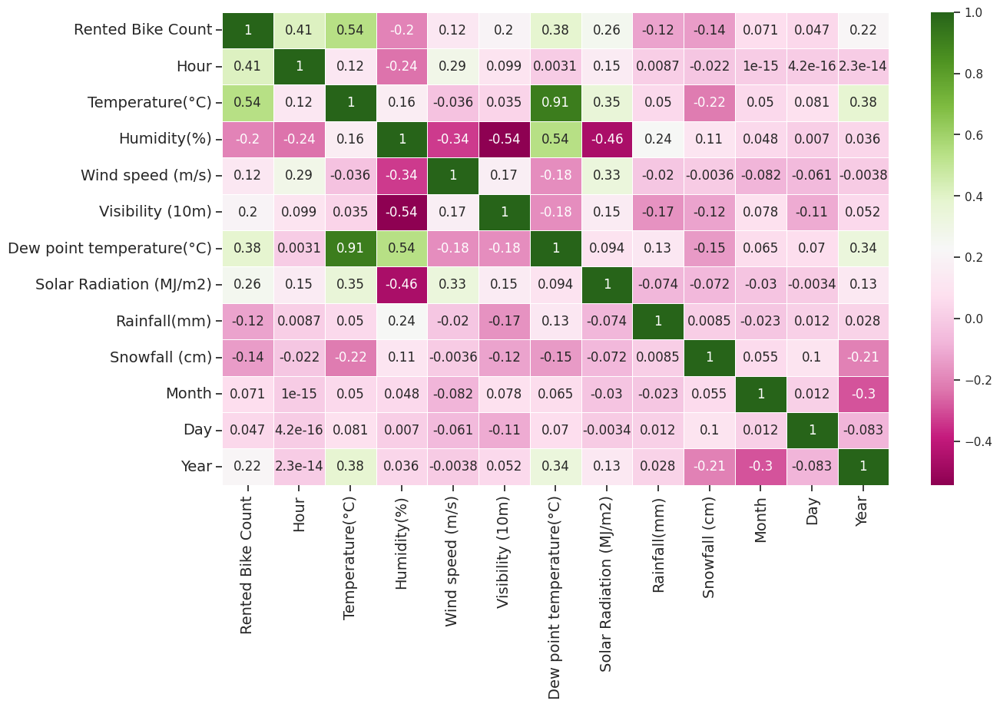

In [ ]:
# plotting heatmap with correlation value to check relation between multiple variable
sns.set_context('notebook')
plt.figure(figsize = (14,8))
plt.xticks(fontsize= 14)
plt.yticks(fontsize= 14)
sns.heatmap(data.corr(), annot=True, linewidth=.5,cmap="PiYG");

If two variable or features show relationship either in same or opposite direction, then these variables thus show correlation between them.

Feature like Temperature(°C) and Dew point temperature(°C) show correlation and in general, an absolute correlation coefficient of >0.7 among two or more predictors indicates the presence of multicollinearity.

In [ ]:
# Continuous Data
continuous = [x for x in col if x not in discrete]
continuous

['Rented Bike Count',
 'Hour',
 'Temperature(°C)',
 'Humidity(%)',
 'Wind speed (m/s)',
 'Visibility (10m)',
 'Dew point temperature(°C)',
 'Solar Radiation (MJ/m2)',
 'Rainfall(mm)',
 'Snowfall (cm)',
 'Month',
 'Day']

**Skewness of data**

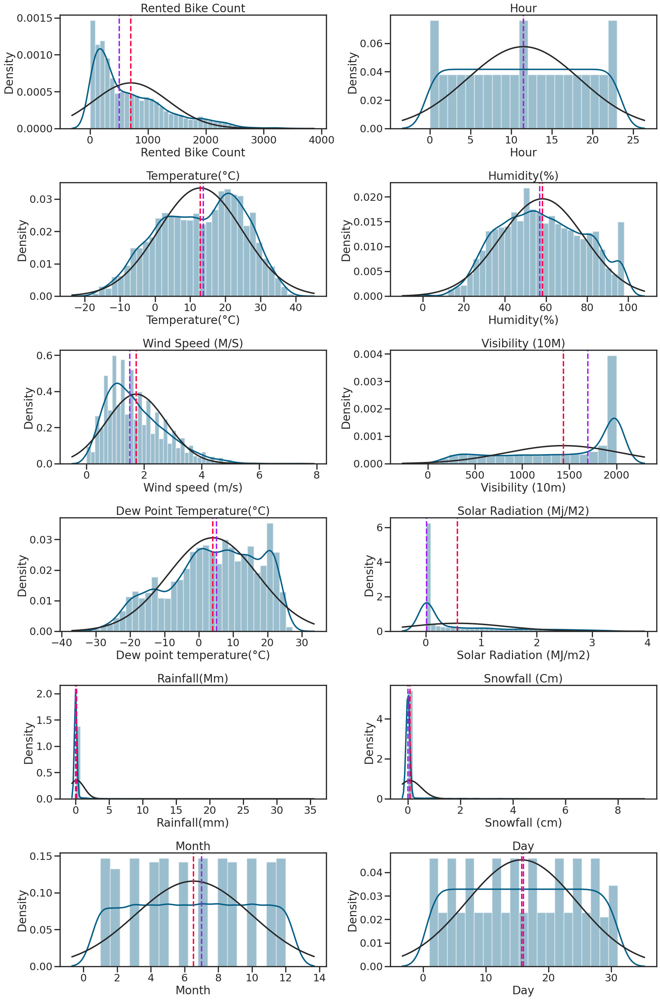

In [ ]:
#analysing numerical value using density plot with mean and median
def density_plot(data,continuous):
  graph = plt.figure(figsize = (20,30))
  for i,col in enumerate(continuous) :
    sns.set_context('poster');
    plt.subplot(6,2,i+1);
    sns.distplot(data[col], color = '#055E85', fit = norm);
    feature = data[col]
    plt.axvline(feature.mean(), color='#ff033e', linestyle='dashed', linewidth=3,label= 'mean');  #Rose-Red Color indicate mean of data
    plt.axvline(feature.median(), color='#A020F0', linestyle='dashed', linewidth=3,label='median'); #Cyan indicate median of data
    plt.title(f'{col.title()}');
    plt.tight_layout();
density_plot(data,continuous)

skew = measure of asymmetry of a distribution

kurtosis = quantify shape of a distribution

In [ ]:
data.kurtosis().sort_values(ascending= True)

Month                        -1.207
Hour                         -1.204
Day                          -1.193
Visibility (10m)             -0.962
Temperature(°C)              -0.838
Humidity(%)                  -0.804
Dew point temperature(°C)    -0.755
Wind speed (m/s)              0.727
Rented Bike Count             0.853
Solar Radiation (MJ/m2)       1.126
Year                          6.872
Snowfall (cm)                93.803
Rainfall(mm)                284.991
dtype: float64

In [ ]:
data.skew().sort_values(ascending= True)

Year                        -2.978
Visibility (10m)            -0.702
Dew point temperature(°C)   -0.367
Temperature(°C)             -0.198
Month                       -0.010
Hour                         0.000
Day                          0.008
Humidity(%)                  0.060
Wind speed (m/s)             0.891
Rented Bike Count            1.153
Solar Radiation (MJ/m2)      1.504
Snowfall (cm)                8.441
Rainfall(mm)                14.533
dtype: float64

From the above graph we can summarise that:

**Right/Positive Skewed Distribution:** Mode < Median < Mean: Rented_Bike_Count, Wind_speed, Solar Radiation, Snowfall, Rainfall

**No Skew:** Mean = Median = Mode : Hour, Month, Day, Humidity

**Left/Negative Skewed Distribution:** Mean < Median < Mode: Year, visibility, Dew Point Temperature, Temperature

**CONCLUSION**

**From the above EDA, these are some conclusions:**

Features like Rented_Bike_Count, Wind_speed and Solar Radiation(MJ/m2) shows positive skewness.

Feature visibility(10m) shows negative skewness.

Demand for bike is more during moring and evening mostly around 7-9 in morning and 6-8 in evening.

Demand for bike is more during working days than on weekend.

Demand for bike is zero on non functional day.

Demand of bike is less on holiday.

Demand of bike is more during summer than in winter.

# **Outliers Detection**

Outliers are those data points that are significantly different from the rest of the data points in the dataset. These can cause the data to skew and affect the accuracy of the ML model.

In [ ]:
#Creating a list of columns that can possibly contain outliers
possible_outlier_cols = list(data.describe().columns)
possible_outlier_cols = list(set(data.describe().columns)-{'Year'})
possible_outlier_cols

['Solar Radiation (MJ/m2)',
 'Snowfall (cm)',
 'Rented Bike Count',
 'Hour',
 'Humidity(%)',
 'Visibility (10m)',
 'Dew point temperature(°C)',
 'Wind speed (m/s)',
 'Day',
 'Rainfall(mm)',
 'Month',
 'Temperature(°C)']

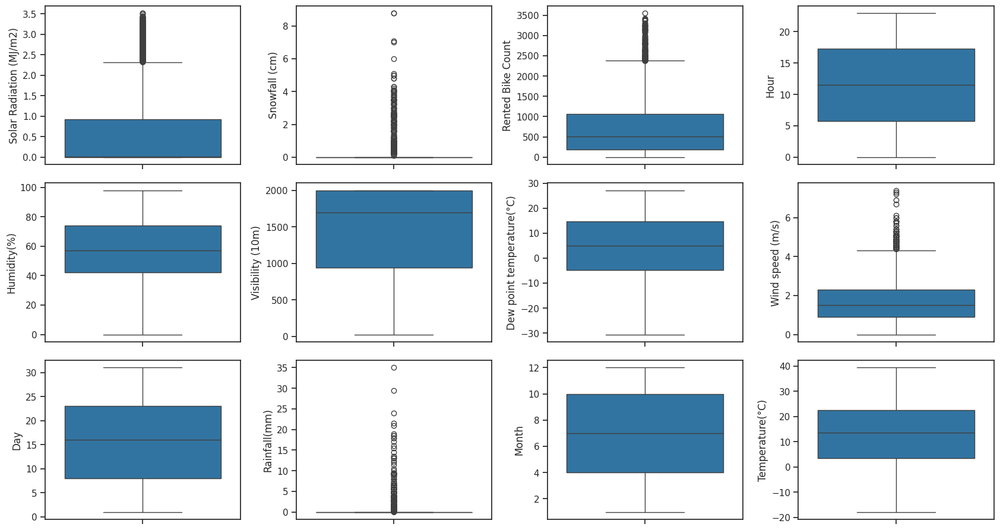

In [ ]:
#Creating a boxplot to detect columns with outliers
plt.figure(figsize=(17,12))
for index,item in enumerate(possible_outlier_cols):
  plt.subplot(4,4,index+1)
  sns.boxplot(data[item])
plt.tight_layout()
plt.show()

Here we can see that the columns that contain outliers are Rainfall, Snowfall, Windspeed and Solar Radiation

**Multicollinearity**

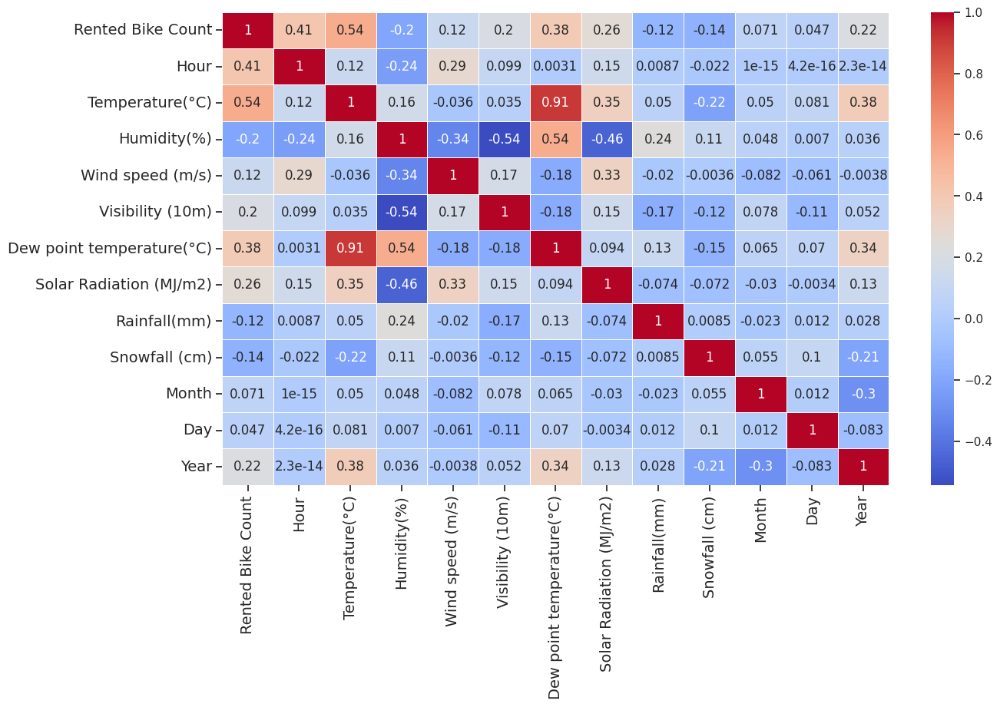

In [ ]:
# plotting heatmap with correlation value to check relation between multiple variable
sns.set_context('notebook')
plt.figure(figsize = (14,8))
plt.xticks(fontsize= 14)
plt.yticks(fontsize= 14)
sns.heatmap(data.corr(), annot=True, linewidth=.5,cmap="coolwarm");

Anytime an independent variable (feature) has a strong correlation with another independent variable, that situation is referred to as multicollinearity. Although it may not initially appear to be a problem,but as the basic objective of regression analysis is to find correlations between the independent variable and the target variable these features with high correlation can undoubtedly introduce some errors into our results.
In the above heatmap (EDA -multivariate analysis), two feature showed correlation of 0.91 i.e., temperature and dew point temperature.

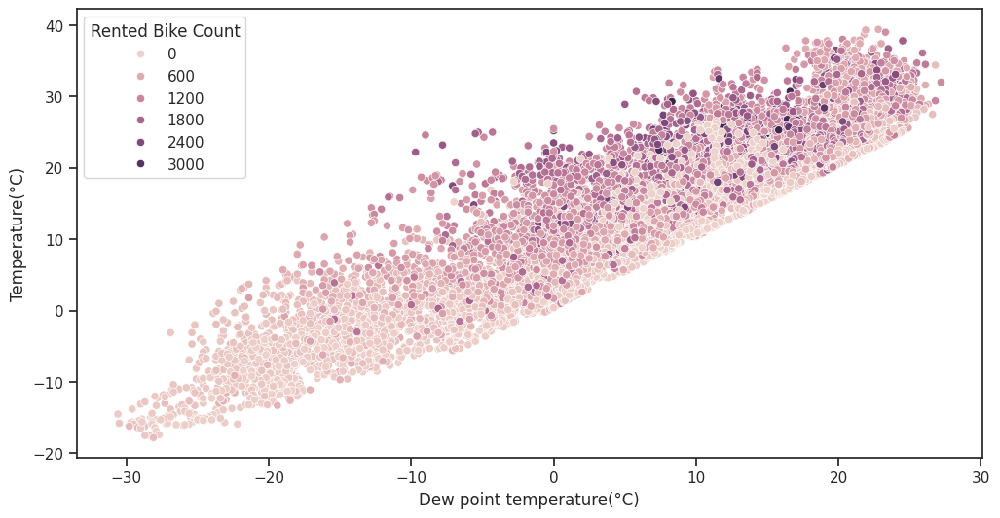

In [ ]:
#scatter plot between Dew point temperature and temperature
plt.figure(figsize = (12,6))
sns.scatterplot(x= data["Dew point temperature(°C)"], y= data["Temperature(°C)"], hue= data['Rented Bike Count']); # both are correlated

**VIF**

Calculating vif identify the strength of correlation between independent variable and the strength of that correlation.

Vif starts at 1 and has no upper limit.

**1-5 :** Moderate, No corrective measure

**Greater than 5:** Severe, Coefficient and p-value are questionable

In [ ]:
# Calculating VIF

def get_vif(data):
  vif = pd.DataFrame()
  vif['Variables'] = data.columns
  vif['VIF'] = [variance_inflation_factor(data.values,i) for i in range(data.shape[1])]
  return vif

In [ ]:
not_for_vif = ['Day', 'Month', 'Year', 'Rented Bike Count']
get_vif(data[[i for i in data.describe().columns if i not in not_for_vif]])

,Variables,VIF
0,Hour,4.418
1,Temperature(°C),33.385
2,Humidity(%),5.372
3,Wind speed (m/s),4.805
4,Visibility (10m),9.086
5,Dew point temperature(°C),17.126
6,Solar Radiation (MJ/m2),2.882
7,Rainfall(mm),1.082
8,Snowfall (cm),1.121


Since VIF score for temperature and dew point temperature is more than 10, either dropping one value or combining both value can help getting better solution, since temperature and dew point temperature show relation.

We drop Dew Point Temperature because it has low correlation with Rented Bike Count which is 0.38 in comparison to Temperature which is 0.54.

In [ ]:
# Drop Dew Point Temperature

not_for_vif = ['Day', 'Month', 'Year', 'Rented Bike Count', 'Dew point temperature(°C)']
get_vif(data[[i for i in data.describe().columns if i not in not_for_vif]])

,Variables,VIF
0,Hour,3.922
1,Temperature(°C),3.228
2,Humidity(%),4.868
3,Wind speed (m/s),4.609
4,Visibility (10m),4.710
5,Solar Radiation (MJ/m2),2.247
6,Rainfall(mm),1.079
7,Snowfall (cm),1.121


In [ ]:
new_data= data.drop(['Dew point temperature(°C)'], axis = 1)

# **Feature Engineering**

Machine learning models can only work with numerical values and therefore important categorical columns have to converted/encoded into numerical variables. This process is known as Feature Encoding

**Encoding**

In [ ]:
new_data.head()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Month,Day,WeekDay,Year
0,254,0,-5.200,37,2.200,2000,0.000,0.000,0.000,Winter,No Holiday,Yes,1,12,Thursday,2017
1,204,1,-5.500,38,0.800,2000,0.000,0.000,0.000,Winter,No Holiday,Yes,1,12,Thursday,2017
2,173,2,-6.000,39,1.000,2000,0.000,0.000,0.000,Winter,No Holiday,Yes,1,12,Thursday,2017
3,107,3,-6.200,40,0.900,2000,0.000,0.000,0.000,Winter,No Holiday,Yes,1,12,Thursday,2017
4,78,4,-6.000,36,2.300,2000,0.000,0.000,0.000,Winter,No Holiday,Yes,1,12,Thursday,2017


In [ ]:
new_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Rented Bike Count        8760 non-null   int64  
 1   Hour                     8760 non-null   int64  
 2   Temperature(°C)          8760 non-null   float64
 3   Humidity(%)              8760 non-null   int64  
 4   Wind speed (m/s)         8760 non-null   float64
 5   Visibility (10m)         8760 non-null   int64  
 6   Solar Radiation (MJ/m2)  8760 non-null   float64
 7   Rainfall(mm)             8760 non-null   float64
 8   Snowfall (cm)            8760 non-null   float64
 9   Seasons                  8760 non-null   object 
 10  Holiday                  8760 non-null   object 
 11  Functioning Day          8760 non-null   object 
 12  Month                    8760 non-null   int64  
 13  Day                      8760 non-null   int64  
 14  WeekDay                 

In [ ]:
# Categorical Data
col = new_data._get_numeric_data().columns
categorical = [x for x in new_data.columns if x not in col]
categorical

['Seasons', 'Holiday', 'Functioning Day', 'WeekDay']

In [ ]:
new_data['Holiday'].value_counts()

No Holiday    8328
Holiday        432
Name: Holiday, dtype: int64

In [ ]:
#Label Encoding for Holiday column
new_data['Holiday']= new_data['Holiday'].map({'No Holiday':0, 'Holiday':1})

In [ ]:
new_data['Functioning Day'].value_counts()

Yes    8465
No      295
Name: Functioning Day, dtype: int64

In [ ]:
#Label Encoding for Functioning day
new_data['Functioning Day']= new_data['Functioning Day'].map({'No':0, 'Yes':1})

In [ ]:
new_data['Seasons'].value_counts()

Spring    2208
Summer    2208
Autumn    2184
Winter    2160
Name: Seasons, dtype: int64

In [ ]:
#One hot Encoding for Seasons
new_data_seasons = pd.get_dummies(new_data['Seasons'], drop_first = True)
new_data_seasons.head()

,Spring,Summer,Winter
0,0,0,1
1,0,0,1
2,0,0,1
3,0,0,1
4,0,0,1


In [ ]:
new_data['WeekDay'].value_counts()

Sunday       1296
Wednesday    1272
Tuesday      1272
Thursday     1248
Saturday     1248
Friday       1224
Monday       1200
Name: WeekDay, dtype: int64

In [ ]:
#One hot Encoding for Seasons
new_data_weekday = pd.get_dummies(new_data['WeekDay'], drop_first = True)
new_data_weekday.head()

,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
0,0,0,0,1,0,0
1,0,0,0,1,0,0
2,0,0,0,1,0,0
3,0,0,0,1,0,0
4,0,0,0,1,0,0


In [ ]:
new_data = pd.concat([new_data, new_data_seasons, new_data_weekday], axis= 1)
new_data.head()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,...,Year,Spring,Summer,Winter,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
0,254,0,-5.200,37,2.200,2000,0.000,0.000,0.000,Winter,...,2017,0,0,1,0,0,0,1,0,0
1,204,1,-5.500,38,0.800,2000,0.000,0.000,0.000,Winter,...,2017,0,0,1,0,0,0,1,0,0
2,173,2,-6.000,39,1.000,2000,0.000,0.000,0.000,Winter,...,2017,0,0,1,0,0,0,1,0,0
3,107,3,-6.200,40,0.900,2000,0.000,0.000,0.000,Winter,...,2017,0,0,1,0,0,0,1,0,0
4,78,4,-6.000,36,2.300,2000,0.000,0.000,0.000,Winter,...,2017,0,0,1,0,0,0,1,0,0


In [ ]:
new_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 25 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Rented Bike Count        8760 non-null   int64  
 1   Hour                     8760 non-null   int64  
 2   Temperature(°C)          8760 non-null   float64
 3   Humidity(%)              8760 non-null   int64  
 4   Wind speed (m/s)         8760 non-null   float64
 5   Visibility (10m)         8760 non-null   int64  
 6   Solar Radiation (MJ/m2)  8760 non-null   float64
 7   Rainfall(mm)             8760 non-null   float64
 8   Snowfall (cm)            8760 non-null   float64
 9   Seasons                  8760 non-null   object 
 10  Holiday                  8760 non-null   int64  
 11  Functioning Day          8760 non-null   int64  
 12  Month                    8760 non-null   int64  
 13  Day                      8760 non-null   int64  
 14  WeekDay                 

In [ ]:
new_data.drop(['Seasons', 'WeekDay'], axis= 1, inplace= True)
new_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 23 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Rented Bike Count        8760 non-null   int64  
 1   Hour                     8760 non-null   int64  
 2   Temperature(°C)          8760 non-null   float64
 3   Humidity(%)              8760 non-null   int64  
 4   Wind speed (m/s)         8760 non-null   float64
 5   Visibility (10m)         8760 non-null   int64  
 6   Solar Radiation (MJ/m2)  8760 non-null   float64
 7   Rainfall(mm)             8760 non-null   float64
 8   Snowfall (cm)            8760 non-null   float64
 9   Holiday                  8760 non-null   int64  
 10  Functioning Day          8760 non-null   int64  
 11  Month                    8760 non-null   int64  
 12  Day                      8760 non-null   int64  
 13  Year                     8760 non-null   int64  
 14  Spring                  

In [ ]:
new_data.shape

(8760, 23)

# **Split Data for Training and Testing**

In [ ]:
#X = independent variable and y = target variable
x= new_data.drop('Rented Bike Count',axis=1)
y= new_data['Rented Bike Count']

In [ ]:
#spilitting into test and train data set
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.20, random_state = 7)

In [ ]:
print(f'Shape of X_train => {x_train.shape}, Shape of X_test => {x_test.shape}' )
print(f'Shape of y_train => {y_train.shape}, Shape of y_test => {y_test.shape}' )

Shape of X_train => (7008, 22), Shape of X_test => (1752, 22)
Shape of y_train => (7008,), Shape of y_test => (1752,)


# **Feature Scaling**

Feature Scaling is a technique to standardize the independent features present in the data in a fixed range. It is performed during the data pre-processing to handle highly varying magnitudes or values or units. If feature scaling is not done, then a machine learning algorithm tends to weigh greater values, higher and consider smaller values as the lower values, regardless of the unit of the values.

Two ways of feature scaling:

**Min max normalization**

**Standardisation**

In this project I'm going to use the standardisation method with the help of the StandardScaler() function.

In [ ]:
#Creating object for the StandardScaler function
scaler = StandardScaler()
scaler.fit(x_train)

StandardScaler()

In [ ]:
#Standardizing the independent variables
x_train = scaler.transform(x_train)
x_test = scaler.transform(x_test)

In [ ]:
#Overview of what a dataframe looks like after standardizing
X_train[:2]

array([[ 0.07274193, -1.2414195 , -1.38372858, -0.31518172,  0.47397506,
         0.66301415, -0.13560401, -0.17280291, -0.22927786,  0.18627021,
         0.42450442, -0.41975827, -3.25617091, -0.57229726, -0.58218357,
         1.73271013, -0.39816906,  2.4655198 , -0.41437956, -0.41011547,
        -0.40987803, -0.41791911],
       [ 1.08362808, -0.4055544 , -0.30714067,  0.35782057,  0.92130965,
        -0.65333896, -0.13560401, -0.17280291, -0.22927786,  0.18627021,
         1.00350929,  1.63201015,  0.30710919, -0.57229726, -0.58218357,
        -0.57713058, -0.39816906, -0.40559398, -0.41437956, -0.41011547,
         2.43975018, -0.41791911]])

In [ ]:
# Mean values of all features
scaler.mean_

array([1.14962900e+01, 1.28519121e+01, 5.82763984e+01, 1.72782534e+00,
       1.43980137e+03, 5.65810502e-01, 1.47103311e-01, 7.74543379e-02,
       4.99429224e-02, 9.66466895e-01, 6.53367580e+00, 1.56825057e+01,
       2.01791381e+03, 2.46718037e-01, 2.53139269e-01, 2.49857306e-01,
       1.36843607e-01, 1.41267123e-01, 1.46546804e-01, 1.43978311e-01,
       1.43835616e-01, 1.48687215e-01])

In [ ]:
# Scale values of all features
scaler.scale_

array([6.92461759e+00, 1.19636529e+01, 2.04349313e+01, 1.04011533e+00,
       6.08045983e+02, 8.66029028e-01, 1.08480063e+00, 4.48223565e-01,
       2.17827057e-01, 1.80023987e-01, 3.45420242e+00, 8.77291988e+00,
       2.80640301e-01, 4.31101203e-01, 4.34810050e-01, 4.32930286e-01,
       3.43682171e-01, 3.48296889e-01, 3.53653556e-01, 3.51067738e-01,
       3.50922971e-01, 3.55779885e-01])

# **Model Implementation:**

**Calculate Evaluation Metrics for different models**

In [ ]:
model_score = []
def get_metrics(y_true, y_pred, model_name):
  model_data = {}
  MSE = mse(y_test, y_pred)
  RMSE = np.sqrt(MSE)
  MAE = mae(y_test, y_pred)
  R2 = r2(y_test, y_pred)
  Adjusted_R2 = 1-(1-r2(y_test,y_pred))*((x_test.shape[0]-1)/(x_test.shape[0]-x_test.shape[1]-1))
  # print(f"{model_name} : ['mean_squared_error' : {round(MSE,3)}, 'Root Mean Squared Error' : {round(RMSE,3)}, 'Mean Absolute Error' : {round(MAE,3)}, 'R Square Error' : {round(R2,3)}, 'Adjusted R2 score' : {round(Adjusted_R2,3)}]")
  model_data['Name'] = model_name
  model_data['MSE'] = MSE
  model_data['RMSE'] = RMSE
  model_data['R2'] = R2
  model_data['Adjusted R2'] = Adjusted_R2
  model_score.append(model_data)

**Linear Regression Model**

As stated earlier linear regression is a regression technique, and it comes under supervised learning. Linear regression performs the task to predict a dependent variable value (y) based on a given independent variable value (x). So, this regression technique finds out a linear relationship between x (input) and y(output)

In [ ]:
#Training the linear regression model

lr_model = LinearRegression().fit(x_train,y_train)

In [ ]:
#Checking the score of the linear regression model

lr_model.score(x_train,y_train)

0.5522833912328107

In [ ]:
#Checking the coefficient values of the linear regression model

lr_model.coef_

array([ 189.35527692,  318.1487243 , -170.39075519,   20.60283203,
          1.43781727,  -75.66979379,  -69.85495648,   11.11618438,
        -27.34686704,  166.63666865,   -3.39730669,  -16.97095147,
        -29.85964161,  -65.80608169,  -71.17920153, -179.81040856,
         -1.21280257,  -10.03921592,  -26.4820931 ,   -9.70851015,
        -13.10270714,   -2.58782898])

In [ ]:
#Predicting the value of the dependent variable for train and test dataset

y_pred_lr = lr_model.predict(x_test)

**Ridge Regression**

Ridge regression is a method of estimating the coefficients of regression models in scenarios where the independent variables are highly correlated. It uses the linear regression model with the L2 regularization method.

In [ ]:
#Training the ridge regression model

ridge = Ridge().fit(x_train, y_train)
y_pred_ridge = ridge.predict(x_test)

**Lasso Regression**

Lasso regression analysis is a shrinkage and variable selection method for linear regression models. The goal of lasso regression is to obtain the subset of predictors that minimizes prediction error for a quantitative response variable. It uses the Linear regression model with L1 regularization.

In [ ]:
#Training the lasso regression model

lasso = Lasso().fit(x_train, y_train)
y_pred_lasso = lasso.predict(x_test)

**Polynomial Regression**

In it the relationship between the independent variable 'x' and the dependent variable 'y' is modeled as an n-th degree polynomial. It extends the linear regression model by introducing polynomial terms.

In [ ]:
#Training the polynomial regression

poly = PolynomialFeatures(2)
x_train_poly = poly.fit_transform(x_train)
x_test_poly = poly.fit_transform(x_test)

In [ ]:
poly_regression = LinearRegression().fit(x_train_poly, y_train)
y_pred_poly = poly_regression.predict(x_test_poly)

**SVR**

SVR performs regression by finding the function that best fits a set of data points while simultaneously minimizing the prediction error.

In [ ]:
#Training the SVR regression model

svr = SVR().fit(x_train, y_train)
y_pred_svr = svr.predict(x_test)

 **K Nearest Neighbours**

KNN is an instance-based learning algorithm because it relies on instances or observations from the training data to make predictions for new data points.

In [ ]:
#Training the KNN regression model

knn = KNeighborsRegressor().fit(x_train, y_train)
y_pred_knn = knn.predict(x_test)

**Decision Tree**

It works by partitioning the feature space into regions, and for each region, it predicts the target variable based on the majority class (in classification) or the average value (in regression) of the training instances within that region.

In [ ]:
#Training the Decision Tree regression model

decision = DecisionTreeRegressor().fit(x_train, y_train)
y_pred_decision = decision.predict(x_test)

**Random Forest Regression**

A random forest is a meta estimator that fits a number of classifying decision trees on various sub-samples of the dataset and uses averaging to improve the predictive accuracy and control over-fitting.

In [ ]:
#Training the Random Forest regression model

random = RandomForestRegressor().fit(x_train, y_train)
y_pred_random = random.predict(x_test)

**Gradient Boosing**

It builds a strong predictive model by combining the predictions of multiple individual weak learners, typically decision trees, in a sequential manner.

In [ ]:
#Training the Gradient Boost regression model

gradient = GradientBoostingRegressor().fit(x_train, y_train)
y_pred_gradient = gradient.predict(x_test)

**XGB booster**

It is an open-source library that provides an efficient and scalable implementation of gradient boosting algorithms. XGBoost is widely used in machine learning competitions and is known for its speed, accuracy, and versatility.

In [ ]:
#Training the XGB Boost regression model

xgb = XGBRegressor().fit(x_train, y_train)
y_pred_xgb = xgb.predict(x_test)

In [ ]:
get_metrics(y_test, y_pred_lr, 'Linear Regression')                          #Calculating the evaluation metrics for Linear Regression
get_metrics(y_test, y_pred_ridge, 'Ridge regression')                        #Calculating the evaluation metrics for Ridge Regression
get_metrics(y_test, y_pred_lasso, 'Lasso regression')                        #Calculating the evaluation metrics for Lasso Regression
get_metrics(y_test, y_pred_poly, 'Polynomial Regression')                    #Calculating the evaluation metrics for Polynomial Regression
get_metrics(y_test, y_pred_svr, 'SVR regression')                            #Calculating the evaluation metrics for SVR Regression
get_metrics(y_test, y_pred_knn, 'KNN regression')                            #Calculating the evaluation metrics for kNN Regression
get_metrics(y_test, y_pred_decision, 'Decision Tree regression')             #Calculating the evaluation metrics for Decision Tree Regression
get_metrics(y_test, y_pred_random, 'Random Forest regression')               #Calculating the evaluation metrics for Random Forest Regression
get_metrics(y_test, y_pred_gradient, 'Gradient Boosting regression')         #Calculating the evaluation metrics for Gradient Boosting Regression
get_metrics(y_test, y_pred_xgb, 'XGB regression')                            #Calculating the evaluation metrics for XGB Regression



In [ ]:
#result for model
print('The evaluation metrics for different models are: ')
model_df = pd.DataFrame(model_score)
model_df

The evaluation metrics for different models are: 


,Name,MSE,RMSE,R2,Adjusted R2
0,Linear Regression,187152.168,432.611,0.556,0.550
1,Ridge regression,187149.736,432.608,0.556,0.550
2,Lasso regression,187086.399,432.535,0.556,0.551
3,Polynomial Regression,131065.360,362.030,0.689,0.685
4,SVR regression,329885.875,574.357,0.217,0.208
5,KNN regression,103722.207,322.059,0.754,0.751
6,Decision Tree regression,82100.906,286.533,0.805,0.803
7,Random Forest regression,45037.421,212.220,0.893,0.892
8,Gradient Boosting regression,66644.916,258.157,0.842,0.840
9,XGB regression,34979.291,187.028,0.917,0.916


From Above we can conclude that at present we have two models are better in comparison to others:

Random Forest which gives R2 score : 0.89 and

XGB Boost which gives R2 score : 0.91.

**Visualize Model Prediction**

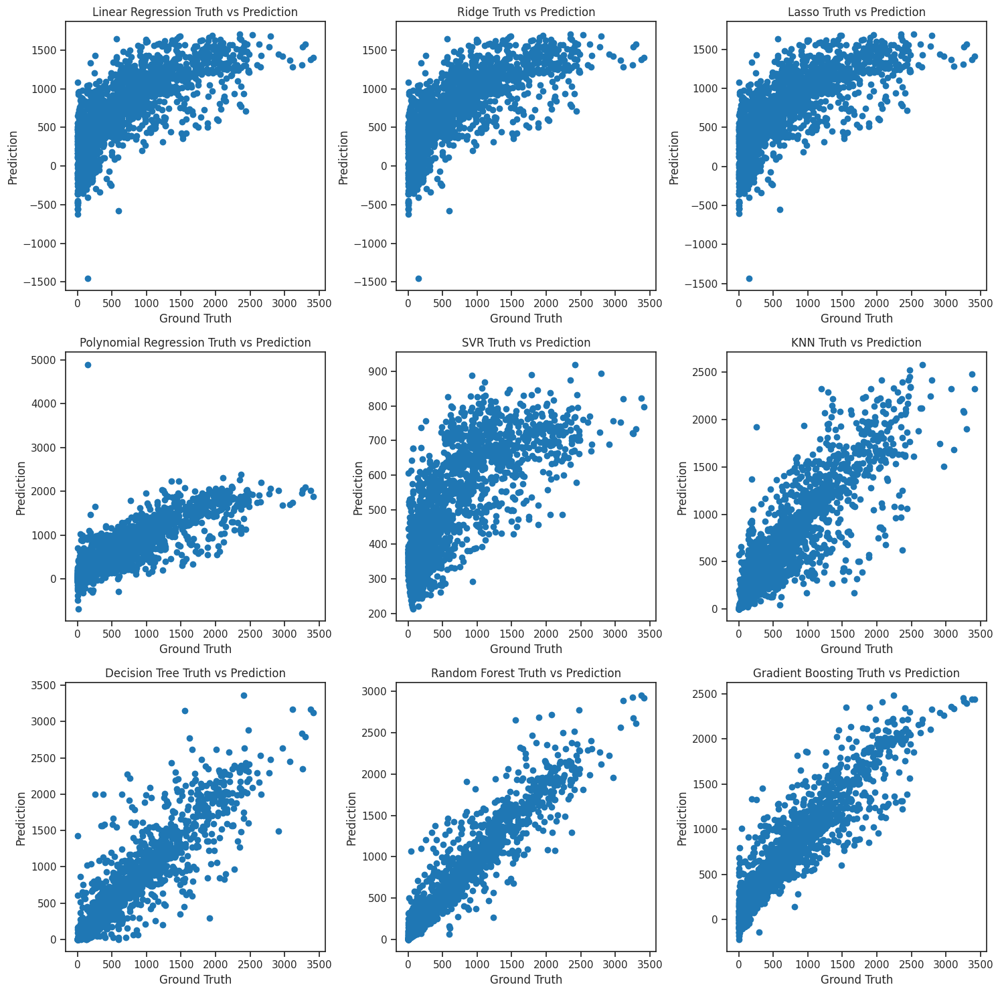

In [ ]:
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Iterate over each prediction array and model name
for ax, pred_array, model_name in zip(axes, [y_pred_lr, y_pred_ridge, y_pred_lasso, y_pred_poly, y_pred_svr, y_pred_knn, y_pred_decision, y_pred_random, y_pred_gradient], ['Linear Regression', 'Ridge', 'Lasso', 'Polynomial Regression', 'SVR', 'KNN', 'Decision Tree', 'Random Forest', 'Gradient Boosting']):
    ax.scatter(y_test, pred_array)
    ax.set_title(f'{model_name} Truth vs Prediction')
    ax.set_xlabel('Ground Truth')
    ax.set_ylabel('Prediction')

# Hide any extra subplots
for i in range(len(axes), len(axes.flatten())):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

# **Hyperparameter tuning for Random Regressor**

In [ ]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]

# Number of features to consider at every split
max_features = ['auto', 'sqrt']

# Maximum number of levels allowed in each decision tree
max_depth = [int(x) for x in np.linspace(10, 120, num=12)]

# Minimum number of samples required to split a node
min_samples_split = [2,5,10]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1,2,4]

# Method of selecting samples for training each tree
bootstrap = [True, False]

# create the random grid
random_grid = {'n_estimators' : n_estimators, 'max_features': max_features, 'max_depth': max_depth, 'min_samples_split': min_samples_split, 'min_samples_leaf': min_samples_leaf, 'bootstrap': bootstrap}

In [ ]:
import time
start_time= time.time()
rf = RandomForestRegressor()
# random search of parameters, using 1 fold cross validation
# search across 100 different combinations, and use all availables cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid)
rf_random.fit(x_train, y_train)
y_pred_rf_random = rf_random.predict(x_test)
print('Time taken to training using randomize search: ', time.time()-start_time)

Time taken to training using randomize search:  1743.3659131526947


In [ ]:
# Best Parameters for the model
rf_random.best_params_

{'n_estimators': 1200,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 50,
 'bootstrap': False}

In [ ]:
# Let's use these best parameters to train our model
rf_tuned = RandomForestRegressor(n_estimators= 1200, min_samples_split= 2,min_samples_leaf= 1,max_features= 'sqrt',max_depth= 50,bootstrap= False)
rf_tuned.fit(x_train, y_train)
y_pred_rf_tuned = rf_tuned.predict(x_test)

In [ ]:
get_metrics(y_test, y_pred_rf_tuned, 'RandomForestRegressor with Best Parameters')
model_df = pd.DataFrame(model_score)
model_df

,Name,MSE,RMSE,R2,Adjusted R2
0,Linear Regression,187152.168,432.611,0.556,0.550
1,Ridge regression,187149.736,432.608,0.556,0.550
2,Lasso regression,187086.399,432.535,0.556,0.551
3,Polynomial Regression,131065.360,362.030,0.689,0.685
4,SVR regression,329885.875,574.357,0.217,0.208
5,KNN regression,103722.207,322.059,0.754,0.751
6,Decision Tree regression,82100.906,286.533,0.805,0.803
7,Random Forest regression,45037.421,212.220,0.893,0.892
8,Gradient Boosting regression,66644.916,258.157,0.842,0.840
9,XGB regression,34979.291,187.028,0.917,0.916


R2 score for Random Forest model increases from 0.89 to 0.90.

# **Hyperparameter tuning for XGB boost Regressor**

In [ ]:
import time
params = {'max_depth': [3,5,6,10,15,20], 'learing_rate': [0.01, 0.1, 0.2, 0.3], 'subsample': [0.5, 0.6, 0.7, 0.8, 0.9, 1], 'colsample_bytree': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'colsample_bylevel': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], 'n_estimators': [100, 500, 1000]}
xgbr = XGBRegressor(seed= 20)
rscv = RandomizedSearchCV(estimator = xgbr, param_distributions= params, scoring= 'neg_mean_squared_error', n_iter= 25, cv= 5, verbose= 1)
rscv.fit(x_train, y_train)
y_pred_xgb_random = rscv.predict(x_test)
print('Time taken to training using randomized search: ', time.time()- start_time)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
Time taken to training using randomized search:  3409.63125705719


In [ ]:
# Best Parameters for the model
rscv.best_params_

{'subsample': 1,
 'n_estimators': 1000,
 'max_depth': 6,
 'learing_rate': 0.1,
 'colsample_bytree': 0.9,
 'colsample_bylevel': 1}

In [ ]:
# Let's use these best parameters to train our model
xgbr = XGBRegressor(n_estimators= 1000, subsample= 1,learning_rate= 0.1,colsample_bytree= 0.9,max_depth= 6,colsample_bylevel= 1, seed= 20)
xgbr.fit(x_train, y_train)
y_pred_xgbr_tuned = xgbr.predict(x_test)

In [ ]:
get_metrics(y_test, y_pred_xgbr_tuned, 'XGBRegressor with Best Parameters')
model_df = pd.DataFrame(model_score)
model_df

,Name,MSE,RMSE,R2,Adjusted R2
0,Linear Regression,187152.168,432.611,0.556,0.550
1,Ridge regression,187149.736,432.608,0.556,0.550
2,Lasso regression,187086.399,432.535,0.556,0.551
3,Polynomial Regression,131065.360,362.030,0.689,0.685
4,SVR regression,329885.875,574.357,0.217,0.208
5,KNN regression,103722.207,322.059,0.754,0.751
6,Decision Tree regression,82100.906,286.533,0.805,0.803
7,Random Forest regression,45037.421,212.220,0.893,0.892
8,Gradient Boosting regression,66644.916,258.157,0.842,0.840
9,XGB regression,34979.291,187.028,0.917,0.916


R2 score for XGBRegressor model increases from 0.91 to 0.93.

# **Conclusion**

**XGBRegressor** and **Random Forest** models shows promising result, therefore it can be used to solve this problem.

Bike rental count is high during week days than on weekend.

Bike demand shows peek around 8-9 AM in the morning and 6 - 7pm in the evening.

People prefer to rent bike more in summer than in winter.

Bike demand is more on clear days than on snowy or rainy days.

Temperature range from 22 to 25(°C) has more demand for bike.

'Hour', 'Temperature(°C)', 'Humidity', 'Wind_speed','Visibility ', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall', 'Snowfall', 'Seasons', 'Holiday', 'month', 'day of week ' regulates bike demand.